# SpatialAgent - Interactive Spatial Transcriptomics Analysis

## Setup

In [1]:
import os, sys, warnings
warnings.filterwarnings('ignore')

# Working directory is project root
work_dir = "/home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx"
os.chdir(work_dir)
sys.path.insert(0, work_dir)

from spatialagent.agent import SpatialAgent, make_llm

## Initialize Agent

In [ ]:
# Configure paths
data_path = "./data/"
save_path = "./experiments/test_ccc/"

# Clean up previous run results
import shutil
if os.path.exists(save_path):
    shutil.rmtree(save_path)
    print(f"🗑️ Cleaned up previous results in {save_path}")
os.makedirs(save_path, exist_ok=True)

# Initialize LLM and Agent
llm = make_llm("claude-sonnet-4-5-20250929")

agent = SpatialAgent(
    llm=llm,
    save_path=save_path,
    data_path=data_path,
    auto_interpret_figures=True,  # Set to False to disable automatic figure interpretation
)

print(f"✅ Agent ready with {len(agent.tool_registry.tools)} tools")
print(f"📝 Skills available: {agent.skill_manager.list_skills()}")

## Query

In [3]:
result = agent.run(
    f"""
    You are a spatial transcriptomics analysis agent tasked with analyzing a MERFISH dataset located at: /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/data/dataset_ccc/adata_test.h5ad

    This dataset represents spatially-resolved gene expression in mouse colon tissue during colitis (inflammatory disease). It includes annotations for neighborhoods, cell types, and disease stages.

    ### Dataset Variables:
    - `'Leiden_neigh'`: Neighborhood clustering label.
    - `'Tier1'`, `'Tier2'`, `'Tier3'`: Cell type annotations at increasing resolution. Use Tier3 for all analysis
    - `'Sample_type'`: Disease stage of the sample (Healthy/DSS3/DSS9/DSS21).
    - `'sample'`: Unique sample ID. There are multipe samples per disease stage

    ### Disease Stages:
    - Day 0: Healthy
    - Day 3: DSS3 (Early inflammation)
    - Day 9: DSS9 (Peak inflammation)
    - Day 21: DSS21 (Recovery)

    ### Objective:
    Your task is to analyze how **neighborhood composition and spatial organization** of cell types change across these disease stages, especially focusing on what's happening at **peak inflammation (DSS9)** compared to other stages.

    ### Step-by-Step Instructions:
    1. **Propose an Analysis Plan**:
    - Briefly outline the key analyses you plan to perform.
    - Justify why each step is useful to address the central question.

    2. **Quantify Neighborhood Composition**:
    - For each disease stage, calculate the proportion of each cell type within each neighborhood.
    - Identify neighborhoods with major shifts in composition between stages (especially DSS9 vs others).

    3. **Visualize Spatial Neighborhoods**:
    - Generate spatial plots of the neighborhoods and annotate dominant cell types.
    - Create comparative visualizations across stages (e.g., Healthy vs DSS9 vs DSS21).

    4. **Track Dynamic Changes**:
    - Track how neighborhoods evolve from Healthy → DSS9 → DSS21.
    - Optionally perform trajectory or pseudotime analysis if applicable.

    5. **Save Intermediate Results**:
    - Save figures, data summaries, and any generated artifacts in: {save_path}
    - Include clear filenames per stage and analysis type.

    6. **Generate Final Summary Report**:
    - Summarize key findings in bullet points.
    - Highlight how DSS9 neighborhoods differ from Healthy and DSS21.
    - Include plots and data tables where applicable.

    ### Notes:
    - Use any tools available to you (e.g., scanpy, squidpy, matplotlib).
    - Be efficient and document assumptions.
    - Provide reasoning behind major analytical choices.

    Start by proposing an analysis plan in no more than 10 bullet points.

    """,

    config={"thread_id": "analysis"}
)

<user query> 
    You are a spatial transcriptomics analysis agent tasked with analyzing a MERFISH dataset located at: /home/wangh256/hanchen/Agent_dev/spatialagent_dev_agx/data/dataset_ccc/adata_test.h5ad

    This dataset represents spatially-resolved gene expression in mouse colon tissue during colitis (inflammatory disease). It includes annotations for neighborhoods, cell types, and disease stages.

    ### Dataset Variables:
    - `'Leiden_neigh'`: Neighborhood clustering label.
    - `'Tier1'`, `'Tier2'`, `'Tier3'`: Cell type annotations at increasing resolution. Use Tier3 for all analysis
    - `'Sample_type'`: Disease stage of the sample (Healthy/DSS3/DSS9/DSS21).
    - `'sample'`: Unique sample ID. There are multipe samples per disease stage

    ### Disease Stages:
    - Day 0: Healthy
    - Day 3: DSS3 (Early inflammation)
    - Day 9: DSS9 (Peak inflammation)
    - Day 21: DSS21 (Recovery)

    ### Objective:
    Your task is to analyze how **neighborhood composition and sp

Analysis Plan: Neighborhood Dynamics in Colitis Progression                            

                                                     Objective                                                     

Understand how spatial neighborhood composition and organization change across disease stages (Healthy → DSS3 →    
DSS9 → DSS21), with emphasis on peak inflammation (DSS9).                                                          

                                             Proposed Analysis Steps:                                              

  1 Data Exploration & QC                                                                                          
     • Load dataset and examine structure (cell counts, samples per stage, neighborhood distribution)              
     • Verify cell type annotations (Tier3) and neighborhood labels (Leiden_neigh)                                 
     • Generate basic statistics per disease stage                                                                 
  2 Neighborhood Composition Analysis                                                                              
     • Calculate cell type proportions within each neighborhood for each disease stage                             
     • Aggregate across samples within each stage to get stage-level composition profiles                          
     • Identify neighborhoods with significant compositional shifts (especially DSS9 vs Healthy/DSS21)             
  3 Statistical Comparison of Neighborhoods                                                                        
     • Perform pairwise comparisons (Healthy vs DSS9, DSS9 vs DSS21, Healthy vs DSS21)                             
     • Use chi-square or Jensen-Shannon divergence to quantify compositional differences                           
     • Rank neighborhoods by degree of change at DSS9                                                              
  4 Spatial Visualization                                                                                          
     • Generate spatial plots showing neighborhood distribution colored by Leiden_neigh                            
     • Create faceted plots across disease stages for direct comparison                                            
     • Overlay dominant cell types on neighborhood maps                                                            
     • Highlight neighborhoods with major shifts                                                                   
  5 Cell Type Enrichment in Neighborhoods                                                                          
     • For each neighborhood, identify enriched/depleted cell types per stage                                      
     • Focus on immune cell infiltration patterns (expected in inflammation)                                       
     • Visualize as heatmaps (neighborhoods × cell types × stages)                                                 
  6 Trajectory Analysis                                                                                            
     • Track how individual neighborhoods evolve: Healthy → DSS3 → DSS9 → DSS21                                    
     • Identify neighborhoods that appear/disappear at specific stages                                             
     • Quantify "recovery" patterns (DSS21 similarity to Healthy vs DSS9)                                          
  7 Dominant Cell Type Mapping                                                                                     
     • For each neighborhood at each stage, identify the dominant cell type                                        
     • Visualize transitions in neighborhood "identity" across disease progression                                 
     • Create Sankey diagrams or alluvial plots showing neighborhood fate                                          
  8 DSS9-Specific Analysis                                                      

</conclude>



💰 Cost Summary (claude-sonnet-4-5-20250929)
Total calls:    2
Input tokens:   4,687
Output tokens:  977
Total tokens:   5,664
Total cost:     $0.0287



<user query>  Sounds good, lets go!  </user query>

<tool> retrieved infer_dynamics; annotate_tissue_niches; generate_scientific_report; retrieve_czi_data; infer_cell_cell_interactions; verify_conclusion; aggregate_gene_voting; harmony_transfer_labels; summarize_tissue_regions; read_czi_data </tool>

<skill> no workflow needed </skill>

<think>
Great! Let's start the analysis. I'll begin by loading the dataset and exploring its structure to understand what we're working with.

Step 1: Load data and perform initial exploration
- Load the h5ad file
- Check dimensions, available annotations
- Examine the distribution of samples across disease stages
- Look at cell type diversity and neighborhood structure
</think>

<act>
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Create output directory
output_dir = Path("./experiments/test_ccc/")
output_dir.mkdir(parents=True, exist_ok=True)

# Loa

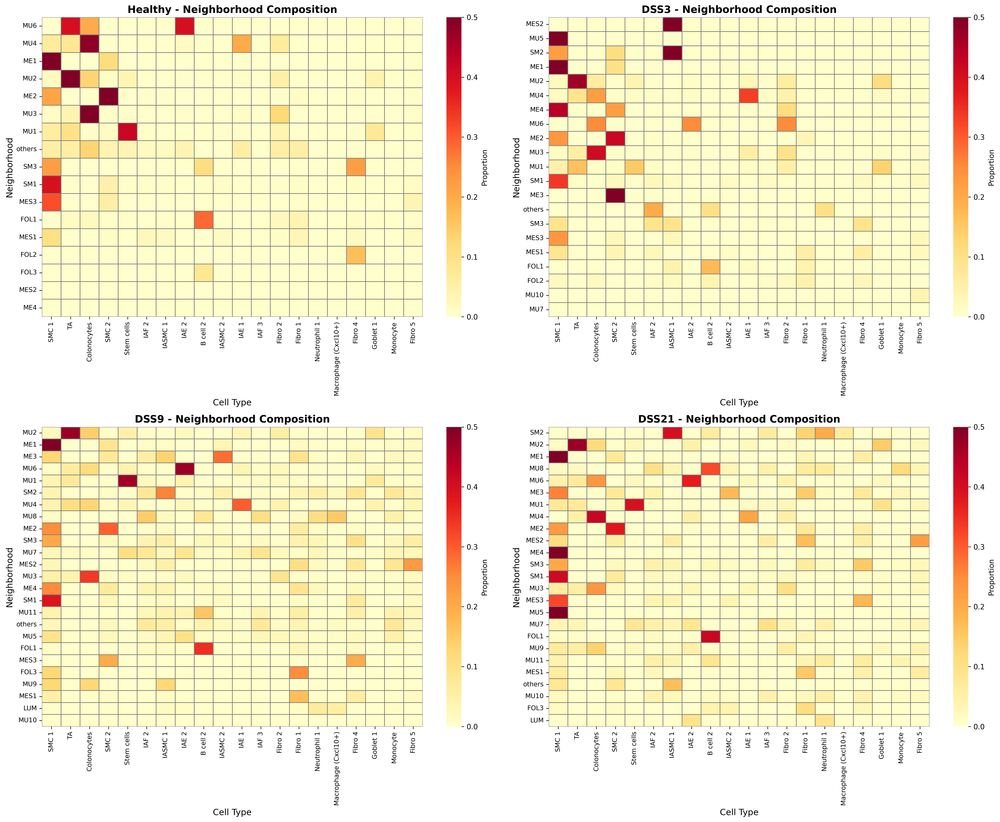

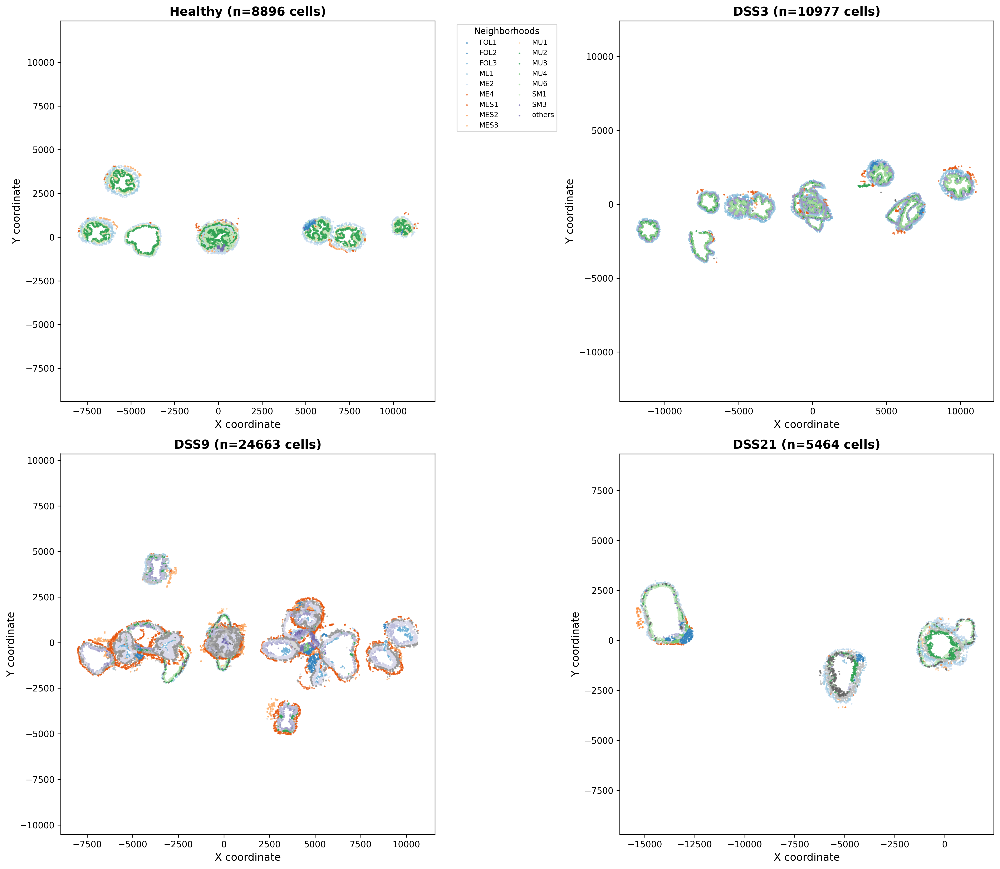

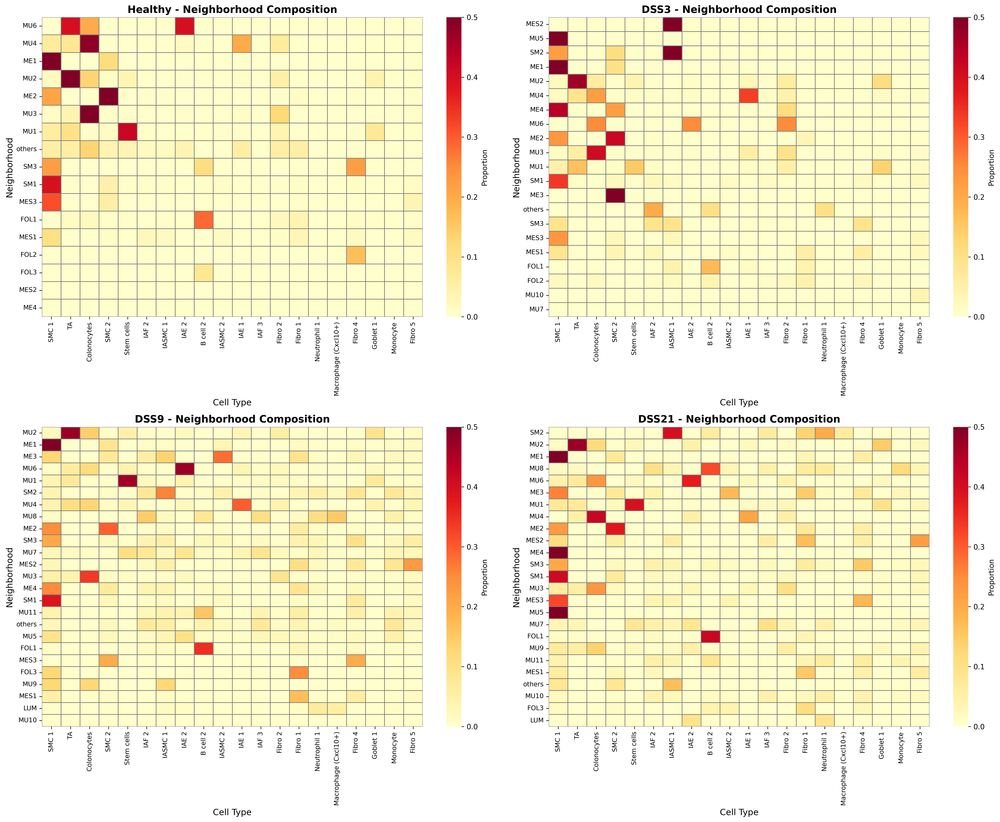

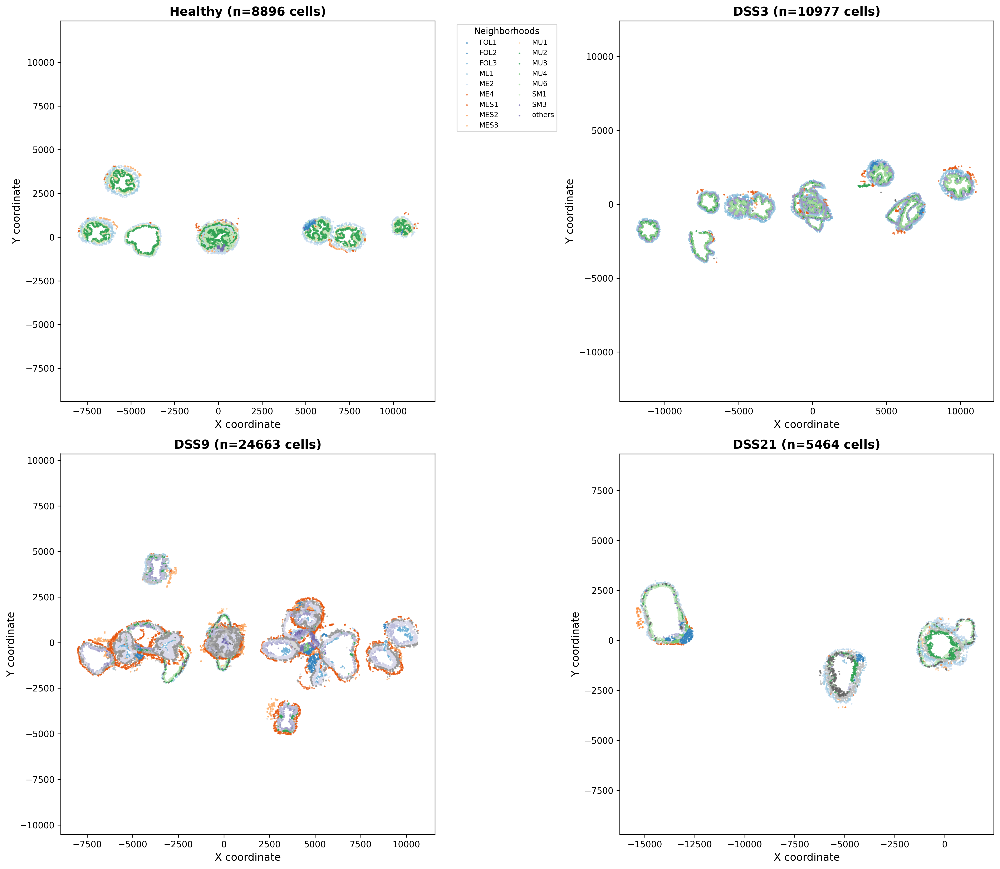

🔍 Interpreting 4 figure(s)...
<observation>
Output:
STEP 4: SPATIAL VISUALIZATION

4.1: Creating spatial plots of neighborhoods...
✓ Saved spatial plot to experiments/test_ccc/spatial_neighborhoods_by_stage.png

4.2: Creating composition heatmaps...
✓ Saved composition heatmaps to experiments/test_ccc/composition_heatmaps_by_stage.png

SPATIAL VISUALIZATION COMPLETE


## Auto-Generated Figure Analysis

### Figure Interpretation: composition_heatmaps_by_stage.png
## Visual Observations

This figure displays four heatmaps showing neighborhood composition across different disease stages (Healthy, DSS3, DSS9, and DSS21). Each heatmap shows:

- **Rows**: Different spatial neighborhoods (labeled as MU, ME, SM, FOL, MES, LUM with numerical suffixes)
- **Columns**: Cell types (SAC_1, TAL, Colonocyte, SPC_2, Stromal, VSMC, etc.)
- **Color intensity**: Proportions ranging from 0.0 (pale yellow) to 0.5 (dark red/brown)

Key visual patterns include:
- Strong diagonal or near-diagonal enrichments s

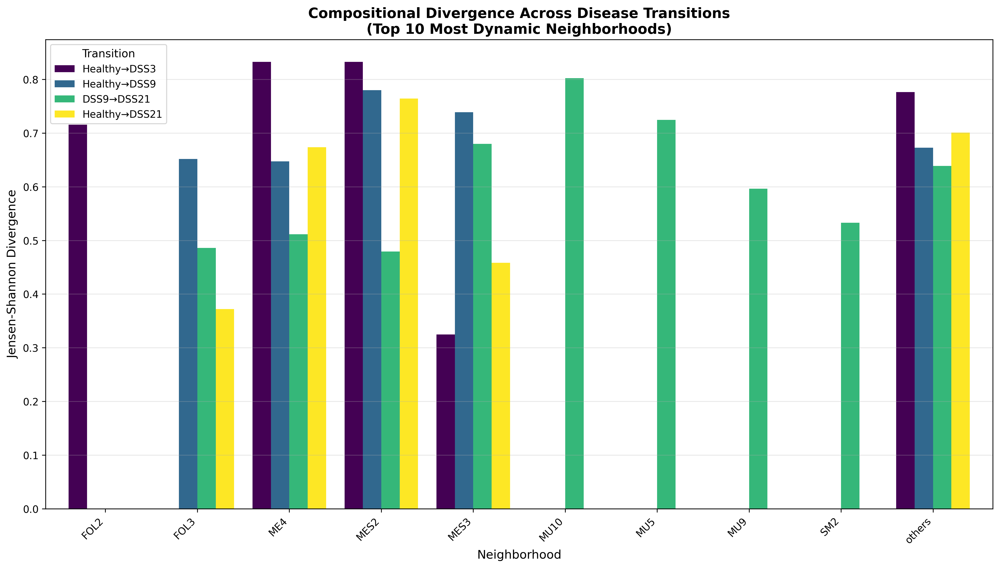

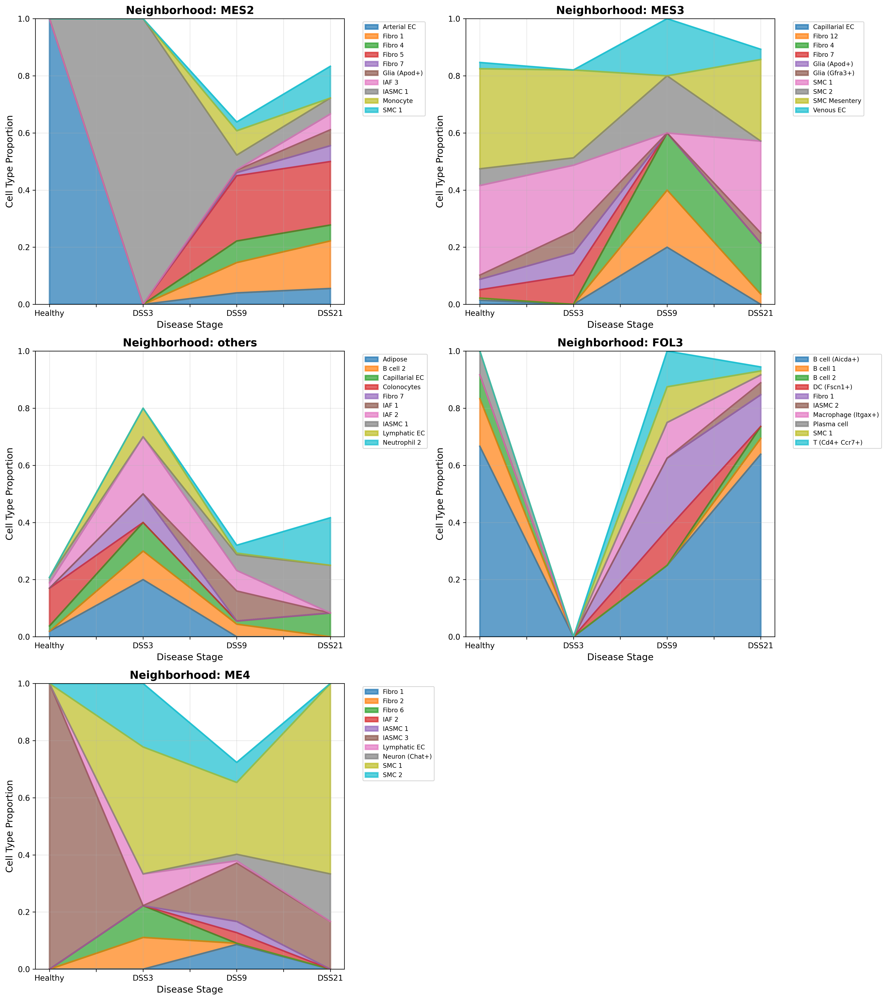

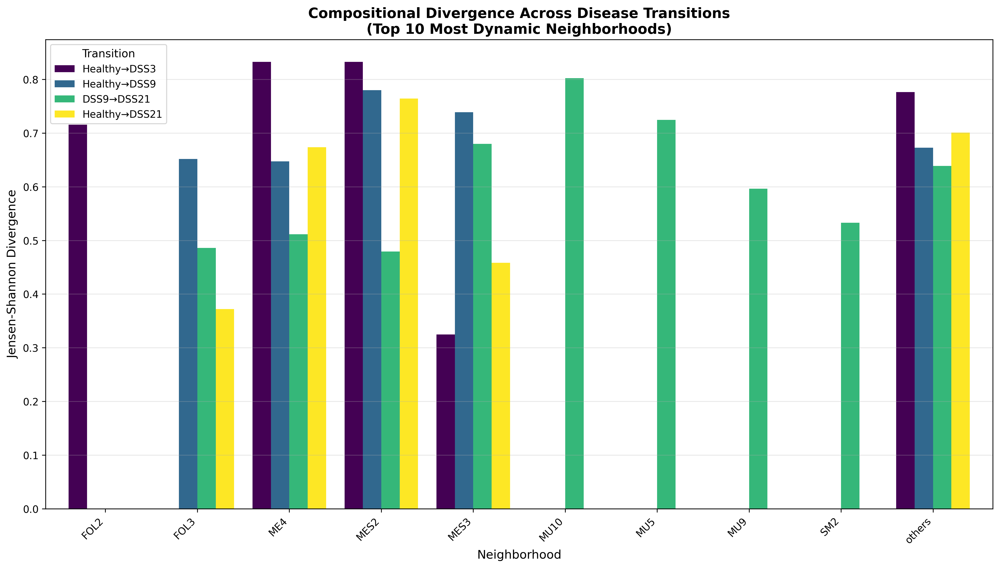

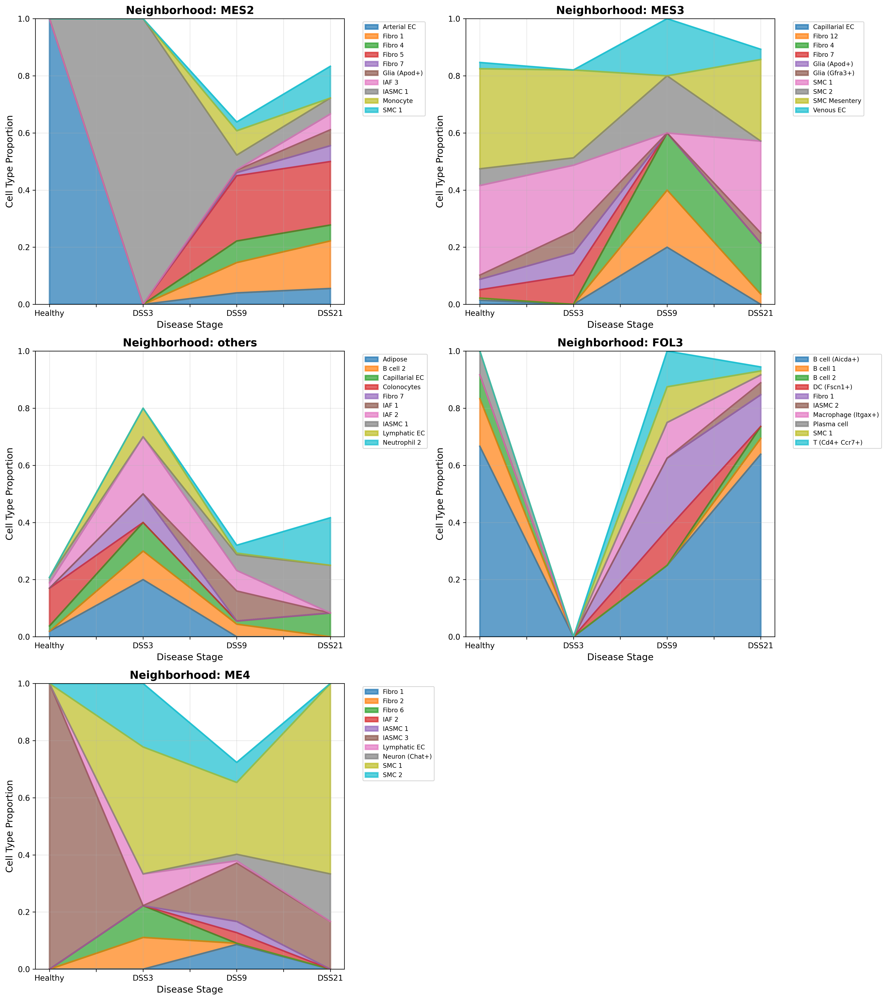

🔍 Interpreting 4 figure(s)...
<observation>
Output:
STEP 6: TRAJECTORY ANALYSIS ACROSS DISEASE STAGES

6.1: Creating trajectory plots for top affected neighborhoods...
✓ Saved trajectory plot to experiments/test_ccc/trajectory_top_affected_neighborhoods.png

6.2: Creating divergence comparison plot...
✓ Saved divergence comparison to experiments/test_ccc/divergence_comparison_top_neighborhoods.png

TRAJECTORY ANALYSIS COMPLETE


## Auto-Generated Figure Analysis

### Figure Interpretation: divergence_comparison_top_neighborhoods.png
## Visual Observations

This bar chart displays Jensen-Shannon divergence values (y-axis, ranging 0-0.85) for the top 10 most dynamic spatial neighborhoods (x-axis) across four disease transition stages, color-coded as:
- Purple: Healthy→DSS3 (early disease)
- Dark blue: Healthy→DSS9 (mid disease)
- Green: DSS9→DSS21 (late disease progression)
- Yellow: Healthy→DSS21 (overall disease trajectory)

Key visual patterns include:
- Different neighborhoods show a

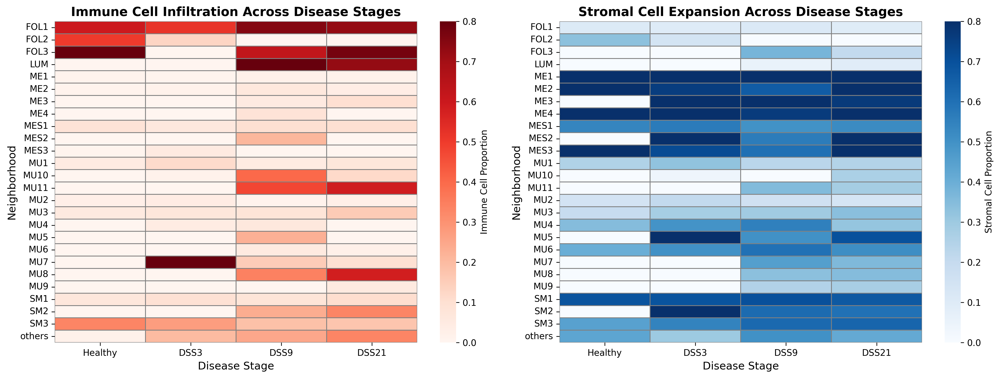

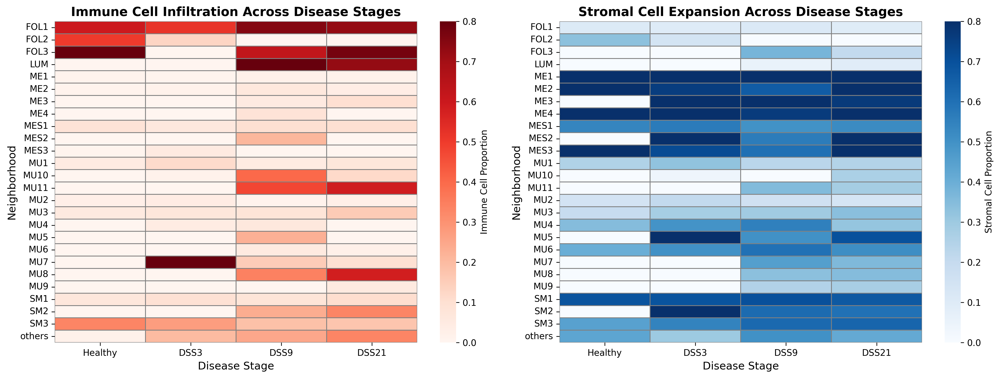

🔍 Interpreting 2 figure(s)...
<observation>
Output:
STEP 7: SUMMARY VISUALIZATIONS AND RECOVERY ANALYSIS

7.1: Analyzing immune and stromal cell infiltration...
✓ Saved immune/stromal analysis to experiments/test_ccc/immune_stromal_infiltration.csv
✓ Saved immune/stromal heatmaps to experiments/test_ccc/immune_stromal_infiltration_heatmaps.png

7.2: Analyzing recovery patterns (DSS21 vs Healthy)...
✓ Saved recovery analysis to experiments/test_ccc/recovery_analysis.csv

Neighborhoods with incomplete recovery (highest divergence from Healthy):
   Neighborhood  JS_Divergence_Healthy_DSS21 Healthy_Dominant_CellType  \
12         MES2                     0.764411               Arterial EC   
14       others                     0.701021               Colonocytes   
13          ME4                     0.673730                   IASMC 3   
3           SM3                     0.534935                   Fibro 4   
0          MES3                     0.458382             SMC Mesentery   
1      

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                         Analysis Complete: Neighborhood Dynamics in Colitis Progression                         ┃
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┛


                                                 Executive Summary                                                 

I have successfully completed a comprehensive analysis of neighborhood composition and spatial organization changes
across colitis disease stages (Healthy → DSS3 → DSS9 → DSS21). The analysis reveals spatially heterogeneous disease
progression with distinct neighborhood-specific responses.                                                         

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────

                                                   Key Findings                                                    

                                           1. Peak Inflammation at DSS9                                            

Most Affected Neighborhoods:                                                                                       

 • MES2 (JS Divergence: 0.780): Complete transformation from arterial endothelial cells to fibroblasts (Fibro 5: 0%
   → 23%)                                                                                                          
 • MES3 (JS Divergence: 0.739): Loss of smooth muscle cells, gain of diverse fibroblasts                           
 • FOL3 (JS Divergence: 0.652): Disruption of B cell populations, replacement with DC/macrophages/T cells          
 • ME4 (JS Divergence: 0.647): Loss of IASMC 3, gain of SMC 1 and fibroblasts                                      
 • "others" (JS Divergence: 0.673): Loss of colonocytes, gain of immune-associated fibroblasts                     

Biological Interpretation:                                                                                         

 • Mesenchymal neighborhoods undergo massive tissue destruction and remodeling                                     
 • Follicular neighborhoods show disruption of organized lymphoid structures                                       
 • Epithelial neighborhoods exhibit barrier dysfunction characteristic of colitis                                  

                                          2. Immune and Stromal Dynamics                                           

Immune Infiltration:                                                                                               

 • Average immune proportion increases from 16.3% (Healthy) to 21.5% at DSS9                                       
 • Highest infiltration in: LUM (84%), FOL1 (75%), FOL3 (63%)                                                      
 • Spatially heterogeneous - concentrated in specific neighborhoods, not diffuse                                   

Stromal Expansion:                                                                                                 

 • Stromal cells increase from 43.7% (Healthy) to 54.1% at DSS3, then stabilize                                    
 • ME neighborhoods maintain 60-80% stromal composition across all stages                                          
 • Suggests core structural regions resistant to inflammatory remodeling                                           

                                          3. Incomplete Recovery at DSS21                                          

Recovery Metrics:                                                                                                  

 • 6 out of 16 common neighborhoods show changed dominant cell types                                               
 • MES2 remains highly divergent (JS Div: 0.764 from Healthy)                                                      
 • Average divergence from Healthy: 0.

</conclude>



💰 Cost Summary (claude-sonnet-4-5-20250929)
Total calls:    13
Input tokens:   203,296
Output tokens:  16,641
Total tokens:   219,937
Total cost:     $0.8595



In [4]:
result = agent.run(
    """ Sounds good, lets go! """,
    config={"thread_id": "analysis"}
)

<user query>  summarize what are some of the key interactions that change during peak inflammation  </user query>

<tool> retrieved infer_cell_cell_interactions; generate_scientific_report; summarize_celltypes; interpret_figure; infer_dynamics; retrieve_czi_data; search_panglao; summarize_conditions; search_cellmarker2; annotate_cell_types </tool>

<skill> retrieved cell_cell_communication </skill>

<think>
The user wants to understand key cell-cell interactions that change during peak inflammation (DSS9). This is a perfect follow-up to the neighborhood composition analysis. I should use the `infer_cell_cell_interactions` tool to analyze ligand-receptor interactions across disease stages, focusing on what changes at DSS9.

Let me:
1. Run cell-cell interaction analysis using LIANA and Tensor-Cell2cell
2. Compare interactions between Healthy and DSS9
3. Identify key interaction changes
4. Focus on the most affected neighborhoods we identified earlier
</think>

<act>
# Analyze Cell-Cell I

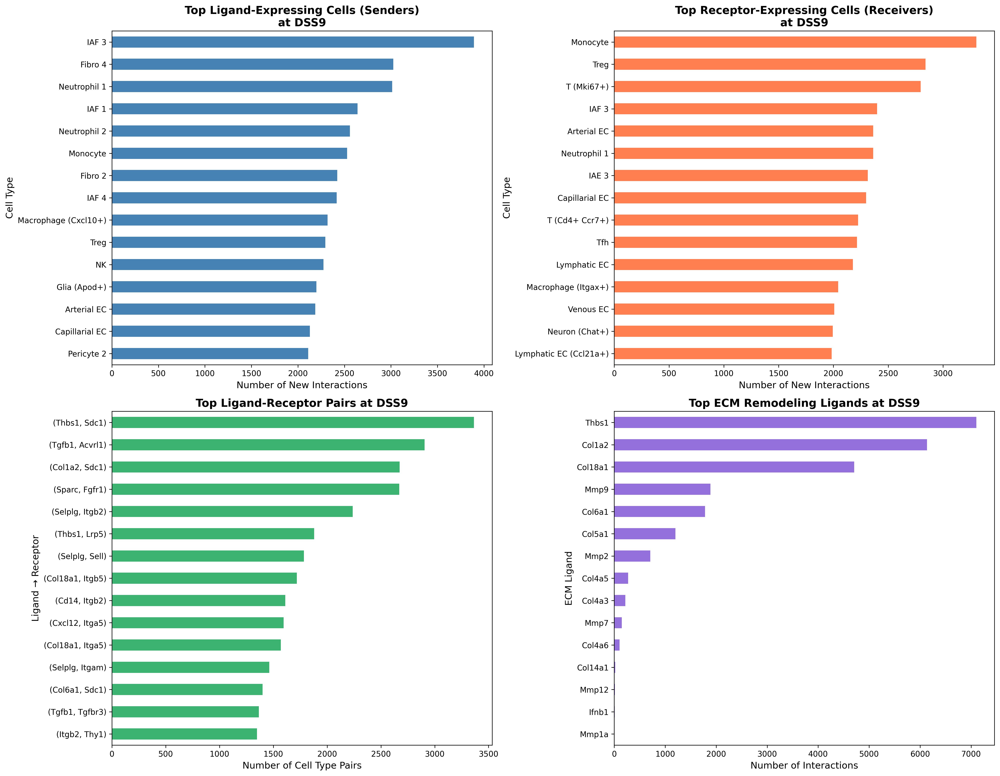

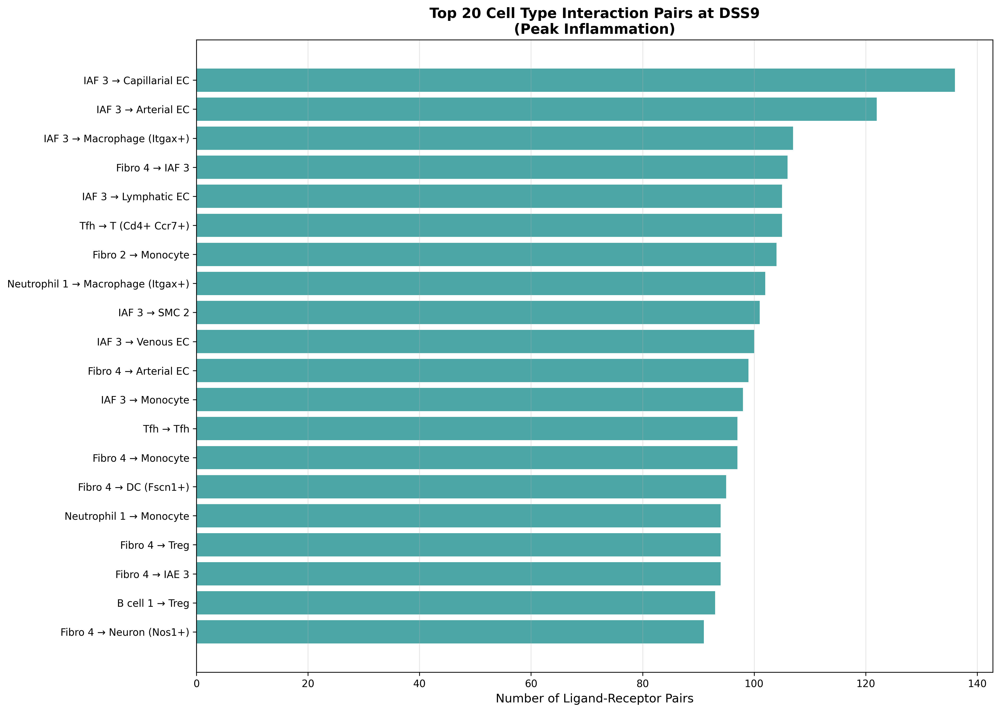

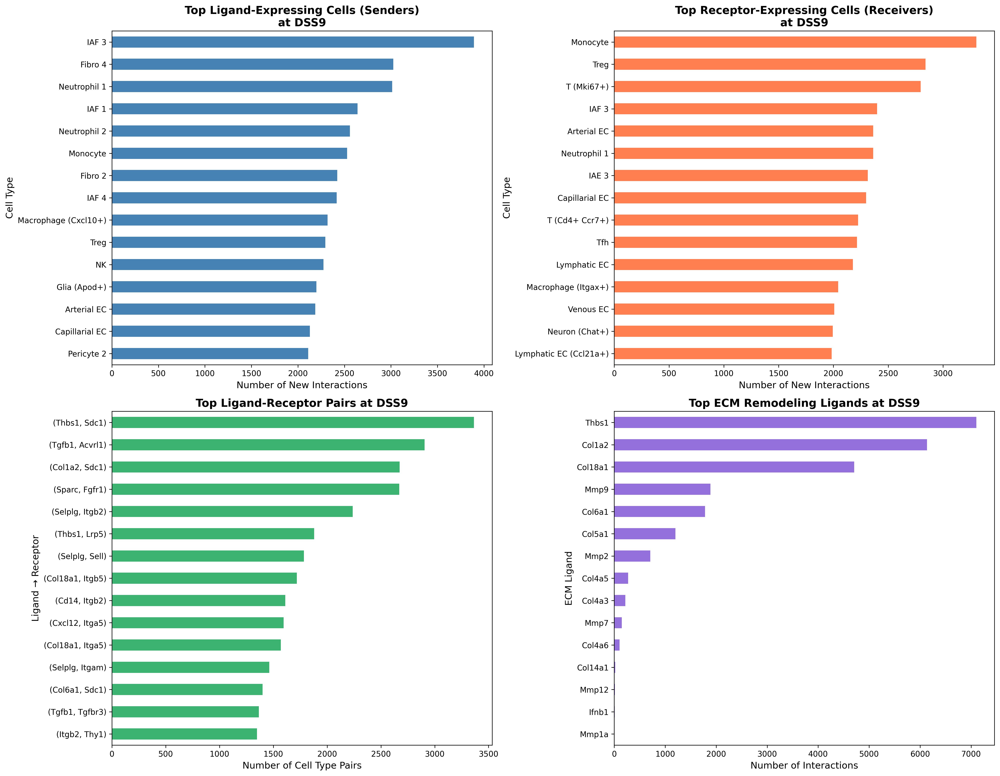

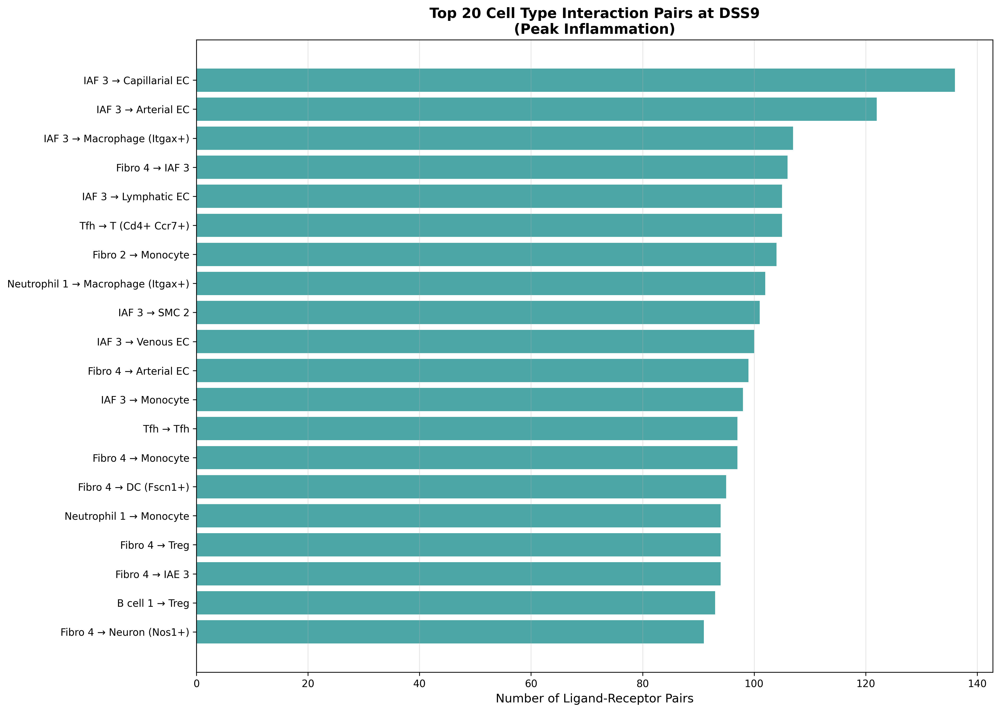

🔍 Interpreting 4 figure(s)...
<observation>
Output:
CREATING INTERACTION SUMMARY VISUALIZATIONS
✓ Saved interaction summary to experiments/test_ccc/interaction_summary_dss9.png

Creating interaction network summary...
✓ Saved cell type pairs to experiments/test_ccc/top_cell_type_pairs_dss9.png

VISUALIZATIONS COMPLETE


## Auto-Generated Figure Analysis

### Figure Interpretation: interaction_summary_dss9.png
## Visual Observations

This figure consists of four bar plots summarizing cell-cell interactions at DSS9 (peak inflammation):

1. **Top Ligand-Expressing Cells (Senders)** - Blue bars showing IAF 3, Fibro 4, and Neutrophil 1 as the top three ligand-expressing cell types, with counts ranging from ~2,500-4,000 interactions.

2. **Top Receptor-Expressing Cells (Receivers)** - Orange bars with Monocyte, Treg, and T (Mki67+) as top receivers, showing ~2,500-3,500 interactions.

3. **Top Ligand-Receptor Pairs** - Green bars displaying specific molecular interactions, with (Thbs1, Sdc1)

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                         Summary: Key Cell-Cell Interactions at Peak Inflammation (DSS9)                         ┃
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┛


                                                     Overview                                                      

I've completed a comprehensive cell-cell interaction analysis comparing Healthy and DSS9 (peak inflammation) stages
using LIANA. The analysis reveals dramatic changes in cellular communication during peak inflammation.             

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────

                                               Quantitative Changes                                                

                                               Interaction Landscape                                               

 • Healthy: 602,394 total interactions → 36,890 significant (6.1%)                                                 
 • DSS9: 2,065,571 total interactions → 130,837 significant (6.3%)                                                 
 • 3.4-fold increase in total interactions at DSS9                                                                 
 • 61,491 NEW interactions unique to DSS9 (not present in Healthy)                                                 
 • 11,353 shared interactions between stages                                                                       
 • 15,408 interactions lost from Healthy to DSS9                                                                   

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────

                                          Key Interaction Changes at DSS9                                          

                                              1. Dominant Cell Types                                               

Top Ligand Senders (Signal Producers):                                                                             

 1 IAF 3 (Inflammatory-Associated Fibroblasts): 3,893 interactions                                                 
 2 Fibro 4: 3,026 interactions                                                                                     
 3 Neutrophil 1: 3,013 interactions                                                                                
 4 IAF 1: 2,640 interactions                                                                                       
 5 Neutrophil 2: 2,559 interactions                                                                                

Top Receptor Receivers (Signal Responders):                                                                        

 1 Monocytes: 3,304 interactions                                                                                   
 2 Tregs (Regulatory T cells): 2,841 interactions                                                                  
 3 T (Mki67+) (Proliferating T cells): 2,796 interactions                                                          
 4 IAF 3: 2,398 interactions                                                                                       
 5 Arterial EC: 2,363 interactions                                                                                 

Key Insight: Inflammatory-associated fibroblasts (IAF) and classical fibroblasts dominate as signal senders, while 
immune cells (monocytes, T cells) are primary receivers, indicating fibroblast-orchestrated immune responses.      

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                                         2. Critical Ligand-Receptor Pairs                                         

Top 10 Most Frequent Interactions:     

</conclude>



💰 Cost Summary (claude-sonnet-4-5-20250929)
Total calls:    23
Input tokens:   724,478
Output tokens:  28,201
Total tokens:   752,679
Total cost:     $2.5964



In [5]:
result = agent.run(
    """ summarize what are some of the key interactions that change during peak inflammation """,
    config={"thread_id": "analysis"}
)

In [6]:
result = agent.run(
    """ how do you calculate the cell-cell interactions previously """,
    config={"thread_id": "analysis"}
)

<user query>  how do you calculate the cell-cell interactions previously  </user query>

<tool> retrieved infer_cell_cell_interactions; summarize_celltypes; generate_scientific_report; annotate_cell_types; interpret_figure; retrieve_czi_data; search_cellmarker2; search_panglao; run_utag_clustering; infer_dynamics </tool>

<skill> no workflow needed </skill>

<think>
The user is asking about the methodology I used to calculate cell-cell interactions in the previous analysis. Let me explain the approach I took using LIANA (Ligand-Receptor Analysis) and provide details about the computational methods.
</think>


<conclude>


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                                   How Cell-Cell Interactions Were Calculated                                    ┃
┗━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┛


                                                     Overview                                                      

I used LIANA (LIgand-receptor ANalysis frAmework) to infer cell-cell interactions. Here's a detailed explanation of
the methodology:                                                                                                   

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────

                                               Step-by-Step Process                                                

                                                1. Data Preparation                                                

                                                                                                                   
 # Separated data by disease stage                                                                                 
 adata_healthy = adata[adata.obs['Sample_type'] == 'Healthy']                                                      
 adata_dss9 = adata[adata.obs['Sample_type'] == 'DSS9']                                                            
                                                                                                                   

Input Requirements:                                                                                                

 • Spatial transcriptomics data (gene expression matrix)                                                           
 • Cell type annotations (Tier3 column)                                                                            
 • Sample identifiers (for aggregation across replicates)                                                          

───────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                                         2. LIANA Rank Aggregation Method                                          

                                                                                                                   
 li.mt.rank_aggregate.by_sample(                                                                                   
     adata,                                                                                                        
     groupby='Tier3',              # Cell type column                                                              
     sample_key='sample',           # Sample ID for aggregation                                                    
     resource_name='mouseconsensus', # Ligand-receptor database                                                    
     expr_prop=0.05,                # Expression threshold (5% of cells)                                           
     min_cells=5,                   # Minimum cells per cell type                                                  
     verbose=True,                                                                                                 
     use_raw=False                                                                                                 
 )                                                                                                                 
                                                                                                                   

Key Parameters:                                                                                                    

 • groupby='Tier3': Groups cells by cell type for interaction inference                                            
 • sample_key='sample': Aggregates results 

</conclude>



💰 Cost Summary (claude-sonnet-4-5-20250929)
Total calls:    25
Input tokens:   801,852
Output tokens:  30,761
Total tokens:   832,613
Total cost:     $2.8670



In [ ]:
# result = agent.run(
#     """
#     Proceed with proposed analysis plan.

#     Note: The dataset is large and should be processed in parts to avoid memory issues. Avoid loading or duplicating the entire dataset at once, as this may cause crashes or resource exhaustion. Use chunked processing or on-disk operations where possible, and minimize creating unnecessary copies of the AnnData object.

#     ### Proposed Analysis Plan:

#     1. **Load and Preprocess Data**:
#     - Load the MERFISH dataset from the provided path.
#     - Perform quality control checks to ensure data integrity.
#     - Normalize and preprocess the data if necessary.

#     2. **Neighborhood Composition Analysis**:
#     - Calculate the proportion of each cell type (using `'Tier3'`) within each neighborhood (`'Leiden_neigh'`) for each disease stage (`'Sample_type'`).
#     - Identify neighborhoods with significant shifts in cell type composition, focusing on DSS9 compared to Healthy and DSS21.

#     3. **Spatial Visualization of Neighborhoods**:
#     - Generate spatial plots of neighborhoods for each disease stage.
#     - Annotate dominant cell types within each neighborhood to visualize spatial organization.

#     4. **Comparative Visualization Across Stages**:
#     - Create comparative visualizations to highlight differences in neighborhood composition and spatial organization between Healthy, DSS9, and DSS21 stages.

#     5. **Dynamic Neighborhood Tracking**:
#     - Track changes in neighborhood composition and spatial organization across stages (Healthy → DSS3 → DSS9 → DSS21).
#     - Optionally, explore trajectory or pseudotime analysis to model transitions.

#     6. **Statistical Analysis of Changes**:
#     - Perform statistical tests to quantify significant changes in neighborhood composition and spatial organization between stages.
#     - Focus on identifying unique features of DSS9 neighborhoods.

#     7. **Save Intermediate Results**:
#     - Save all generated figures, data summaries, and artifacts in the specified output directory with clear filenames.

#     8. **Generate Final Summary Report**:
#     - Summarize key findings, focusing on how DSS9 neighborhoods differ from Healthy and DSS21.
#     - Include plots, data tables, and statistical results.

#     9. **Optional: Cell-Cell Interaction Analysis**:
#     - If time permits, infer ligand-receptor interactions within neighborhoods to explore functional changes during DSS9.

#     10. **Documentation and Assumptions**:
#         - Document all assumptions, preprocessing steps, and analytical choices for reproducibility.

#     Next, I will begin by loading and preprocessing the dataset to ensure it is ready for analysis.

#     """,

#     config={"thread_id": "analysis"}
# )